In [1]:
import numpy as np
import plotly.graph_objects as go
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


In [2]:


t = np.load("./scripts/mbh_high_mass.npz")
z_grid = t["z_grid"]
masses_log = t["masses_log"]
history = t["history"]
z_steps = len(z_grid) - 1




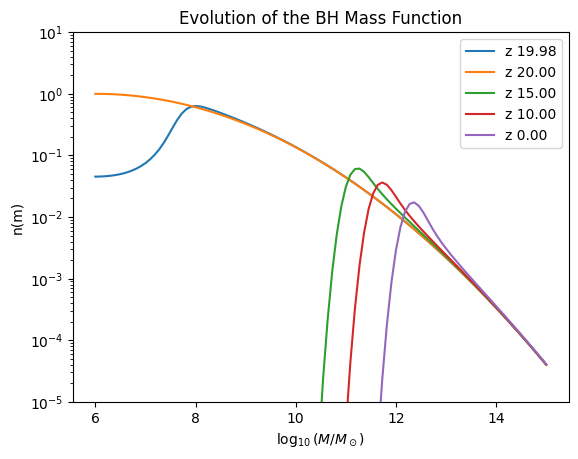

In [3]:
from matplotlib import pyplot as plt

K0 = 1000
plt.plot(masses_log, history[K0], label=f"z {z_grid[K0]:.2f}")
for k in [0, int(z_steps/4), int(z_steps/2), z_steps-1]:
    plt.plot(masses_log, history[k], label=f"z {z_grid[k]:.2f}")
plt.xlabel(r"$\log_{10}(M/M_\odot)$")
plt.ylabel("n(m)")
plt.yscale("log")
plt.ylim([1e-5, 10])
plt.legend()
plt.title("Evolution of the BH Mass Function")
plt.savefig("mbh_high_mass.png", dpi=300)

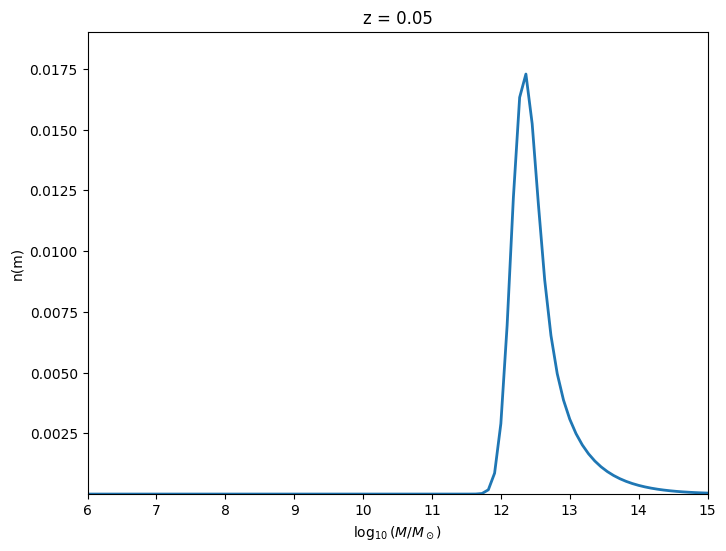

In [4]:
# Supondo que você já tenha:
# z_grid, masses_log, history, z_steps

# Definir intervalo de amostragem (ajuste conforme necessário)
step = int(10000/4)
frames = np.arange(0, z_steps, step)

fig, ax = plt.subplots(figsize=(8,6))

line, = ax.plot([], [], lw=2)
title = ax.set_title("")
ax.set_xlabel(r"$\log_{10}(M/M_\odot)$")
ax.set_ylabel("n(m)")
# ax.set_yscale("log")
ax.set_ylim([1e-5, 2])
ax.set_xlim([masses_log.min(), masses_log.max()])

def init():
    line.set_data([], [])
    title.set_text("")
    return line, title

def update(frame):
    print(f"Frame {frame}/{frames[-1]}", end="\r")
    if frame % 1000 == 0:
        ax.set_ylim([1e-5, history[frame].max() +history[frame].max()/10])
    line.set_data(masses_log, history[frame])
    title.set_text(f"z = {z_grid[frame]:.2f}")
    return line, title

anim = FuncAnimation(fig, update, frames=frames, init_func=init,
                     blit=True, interval=200)

HTML(anim.to_jshtml())

In [5]:
from matplotlib.animation import PillowWriter


anim.save("problema_direto.gif", writer=PillowWriter(fps=5))

In [6]:
sample = [0, int(z_steps/4), int(z_steps/2), z_steps-1]
z_grid_sample = z_grid[sample]
history_sample = history[sample, :]

# Criar malha para 3D
M, Z = np.meshgrid(masses_log, z_grid_sample)   # grades 2D para massas e z
H = history_sample 

H_log = np.log10(np.where(H > 0, H, np.nan))

In [7]:
M, Z = np.meshgrid(masses_log, z_grid_sample)   # grades 2D para massas e z

# Criando o gráfico 3D interativo
fig = go.Figure(data=[go.Surface(z=H_log, x=Z, y=M, colorscale='Viridis',
                                 contours={
            "x": {"show": True, "usecolormap": True, "highlight": True, "project": {"x": True}},
            "y": {"show": True, "usecolormap": True, "highlight": True, "project": {"y": True}},
            "z": {"show": True, "usecolormap": True, "highlight": True, "project": {"z": True}},
        })])

# Rótulos dos eixos
fig.update_layout(
    scene=dict(
        xaxis_title='z',
        yaxis_title='Massa do BH',
        zaxis_title='nbh_obs'
    ),
    width=900,
    height=600
)

fig.show()